![](https://dbuscombe-usgs.github.io/MLMONDAYS/img/favicon.ico)

# ML-Mondays. Week 3: Supervised Image Segmentation


See the [course website](https://dbuscombe-usgs.github.io/MLMONDAYS/) for more information

>A) Live session: We'll work through jupyter notebooks containing workflows for image segmentation (pixelwise classification). We'll be trying to answer the question, How much sand is there in the Outer Banks?. To answer this question, we will train a deep learning model to segment dry sand pixels in aerial (nadir) imagery of the Outer Banks in North Carolina. See the [data page](https://dbuscombe-usgs.github.io/MLMONDAYS/docs/doc2) for more information.

>B) Optional class assignment: an additional dataset will be provided that you can work on using the same models introduced in the class on your own. This dataset consists of aerial UAV color imagery and labels of oyster reefs in shallow water, made publicly available by Duke University researcher Patrick Gray. There are two labels: reef and no reef. Participants will be encouraged to adapt what they learned in the class to their own image segmentation problems using their own data.

## Written by Daniel Buscombe

![](https://mardascience.com/wp-content/uploads/2019/06/cropped-MardaScience_logo-5.png)

MIT License

Copyright (c) 2020, Marda Science LLC

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.

![](https://raw.githubusercontent.com/dbuscombe-usgs/MLMONDAYS/master/3_ImageSeg/notebooks/assets/imseg_summary.png)

![](https://raw.githubusercontent.com/dbuscombe-usgs/MLMONDAYS/master/3_ImageSeg/notebooks/assets/imseg_training.png)

![](https://raw.githubusercontent.com/dbuscombe-usgs/MLMONDAYS/master/3_ImageSeg/notebooks/assets/imseg_prediction.png)

## The Plan

In this exercise, we will build and evaluate models to segment images of beaches. We will do so using two different class subsets on the same set of images. First, a binary segmentation of deep water versus everything else (shallow water and all subaerial environments). Second, four classes; deep water, shallow water, broken water (surf, swash), and dry land. 

To this this, we construct a model that is a U-Net with residual (or lateral/skip connections). For binary segmentation, we use binary image masks, which in turn dictates use of binary categorical crossentropy as a loss function, and a sigmoid activation function for classification.

For multiclass segmentation, we take our label images, which are 2D images consisting of integers that encode classes, into a stack of binary masks of each class. Each binary mask uses 1 to represent the class, and 0 for everything else. This makes it amenable to simultaneous inference of all classes for all pixels using categorical crossentropy, and the softmax activation function on the classifying head. 

We will set up and train 3 different models:

1. for binary (i.e. 2-class) segmentation
2. for 4-class segmentation
3. for 4-class segmentation, using a conditional random field (CRF) for post-processing the predicted label images

We will use the CRF in the same sense as used by [Buscombe and Ritchie, 2018](https://www.mdpi.com/2076-3263/8/7/244), in that the deep learning model predicts the pixel class, but the CRF evaluates the likelihood of that class based on the image itself, and will return a modified version that is usually more accurate.

Finally, we make another model trained in a different way (with a different loss function), so we have two models for the same task. And we create an ensemble model based on the outputs of the CRF model for each label estimate


The general workflow:

1. Set up a data workflow to feed the model as it trains
  * use batches fed optimally to the GPU from TFRecord files
  * split into train (50% of the data) and validation portions (50%)

2. For the binary model, compile with dice loss, to better deal with class imbalance, and with an IoU metric for accuracy assessment. For multiclass models, we use categorical crossentropy

3. Train it
  * we are training the model from scratch because we don't have a similar dataset to train two models and transfer the weights, although that would be ideal possibly
  * use a learning rate scheduler to pass variable learning rates to the model as it trains
  * use 'early stopping' to base cessation of training on observed plateauing of validation loss
  * use a checkpoint to monitor validation loss and save the best model weights when the validation loss improves

4. Evaluate it
  * study the model training history - the loss and accuracy curves of train and validation sets
  * evaluate the performance of the trained model on the validation set
  * read some sample images from file, and use the model for prediction


### Mini-lecture 1: Encoder-decoder networks and UNets

> Slides are [here]()

### Mini-lecture 2: Know thy data

> Access the slides [here]()


Import the `os` library and use it to change directory, just like you might do from the command line

In [2]:
import os

if os.getcwd() is not "/home/jovyan/MLMONDAYS/3_ImageSeg":
    os.chdir('/home/jovyan/MLMONDAYS/3_ImageSeg')
print(os.getcwd())

/home/jovyan/MLMONDAYS/3_ImageSeg


Dowload the data set

In [3]:
if not os.path.exists(os.getcwd()+'/data/obx'):
    print('Downloading data ... takes a few minutes')
    ! python download_data.py

257294336/257294017 [==============================] - 239s 1us/step
Unzipping to ./data ... 
405635072/405629556 [==============================] - 459s 1us/step
Unzipping to ./data ... 


There are a lot of libraries and functions that get imported from `imports.py`. I recommend you look at the contents to see what libraries and functions get imported - there are utilities for file input/output, plotting, making models and more

In [6]:
#!pip install pydensecrf

In [7]:
from imports import *

We've seen functions like this before - they exist only to call another function. You may ask why I chose to do it this way - it would be a valid question!

In [8]:
#-----------------------------------
def get_training_dataset(flag):
    """
    This function will return a batched dataset for model training
    INPUTS: None
    OPTIONAL INPUTS: None
    GLOBAL INPUTS: training_filenames
    OUTPUTS: batched data set object
    """
    return get_batched_dataset_obx(training_filenames, flag)

def get_validation_dataset(flag):
    """
    This function will return a batched dataset for model training
    INPUTS: None
    OPTIONAL INPUTS: None
    GLOBAL INPUTS: validation_filenames
    OUTPUTS: batched data set object
    """
    return get_batched_dataset_obx(validation_filenames, flag)


## Datasets

Each week, we will have more than one dataset to play with. The purpose is primarily to show you subtly different workflows dictated by the specifics of each dataset (dealing with variety in file naming, folder names, labels, splits, image sizes, etc). It also gives you more opportunity to learn in your own time (outside and beyond the class). Each dataset will be described, and you will be pointed to workflows for each dataset - blog posts, code, files, etc.

### Oysternet dataset

https://scholars.duke.edu/display/pub1419444


Aerial UAV color imagery and labels of oyster reefs in shallow water, made publicly available by Duke University researcher Patrick Gray. This dataset, associated with the tool "OysterNet", consists of many small orthomosaics of intertidal oyster reefs and corresponding labels in text format. 

OysterNet is described here: https://github.com/patrickcgray/oyster_net


This version of the data consists of a subset of 1000 x 1000 x 3 pixel orthomosaics of oyster reefs and corresponding labels in text (JSON) format. The dataset consists of 820 images, randomly split into 527 training images, 130 validation images, and 163 test images. Each image pixel has a 3-cm spatial resolution, so each scene is 30 x 30 m.

This dataset has only two classes: intertidal oyster reef and background. The labels have been converted from the original json format to binary label image format (where 1=reef, and 0=everything else). A tutorial describing how this was done is available here: https://colab.research.google.com/drive/1icT8sCXxEKuu_chh8uV27mnqs49ZC6VH




### OBX dataset

Very high-resolution digital images of coastal environments in the Outer Banks, North Carolina. The imagery and associated label data have been curated especially for this course, as part of the USGS Remote Sensing of Coastal Change Florence Supplemental Project.

This dataset is courtesy of the U.S. Geological Survey. These data were collected as part of the USGS Remote Sensing of Coastal Change Florence Supplemental Project, and processed collectively by Wayne Wight, Jonathan Warrick (USGS-PCSMC), Christopher Sherwood (USGS-WHCMSC), Andrew Ritchie (USGS-PCSMC), Jenna Brown (USGS-MD-DE-DC WSC), Christine Kranenburg (USGS-SPCMSC), Jin-Si Over (USGS-WHCMSC), and Daniel Buscombe (USGS-PCSMC contractor). Although these data have been processed successfully on a computer system at the U.S. Geological Survey (USGS), no warranty expressed or implied is made regarding the display or utility of the data for other purposes, nor on all computer systems, nor shall the act of distribution constitute any such warranty. The USGS or the U.S. Government shall not be held liable for improper or incorrect use of the data described and/or contained herein.

The categories are (and corresponding integer values in the image labels):

* deep water (63)
* white (broke, aerated) water (128)
* shallow water and saturated ground (191)
* dry sandy terrain (255)

data/obx/sample
16 high-resolution images of coastal environments in North Carolina


The data are in random order and from different places and times. 

## Binary Image Segmentation

The following notebook is equivalent (in result) to running the following script inside this directory, which you could do by uncommenting and running the cell below


In [9]:
#!python obx_imseg_part1.py

I like to define variables up front. Let's define each one 

* `data_path`: the folder where the tfrecords data are
* `sample_data_path` : the folder where sample jpeg images are
* `filepath`: the filepath to where the model weights will be saved during training
* `patience`: the number of model training training epochs to wait during which time no improvement in loss before training is stopped
* `ims_per_shard`: the number of images (and associated label images) in each tfrecord shard. We need this, and knowledge of the batch size, to compute the number of training and validation steps per epoch to use
* `VALIDATION_SPLIT`: the proportion of files to use for validation

In [10]:
data_path= os.getcwd()+os.sep+"data/obx"

sample_data_path = os.getcwd()+os.sep+"data/obx/sample"

sample_label_data_path = os.getcwd()+os.sep+"data/obx/sample_labels"

filepath = os.getcwd()+os.sep+'results/obx_subset_2class_best_weights_model1.h5'

patience = 20

ims_per_shard = 20

VALIDATION_SPLIT = 0.5

Get a dataset

In [11]:
#-------------------------------------------------
filenames = sorted(tf.io.gfile.glob(data_path+os.sep+'*.tfrec'))

nb_images = ims_per_shard * len(filenames)
print(nb_images)

split = int(len(filenames) * VALIDATION_SPLIT)

training_filenames = filenames[split:]
validation_filenames = filenames[:split]

validation_steps = int(nb_images // len(filenames) * len(validation_filenames)) // BATCH_SIZE
steps_per_epoch = int(nb_images // len(filenames) * len(training_filenames)) // BATCH_SIZE

print(steps_per_epoch)
print(validation_steps)



340
45
40


Data visualization

Get a training and validation data set and plot one batch of images with binary masks overlain as semi-transparent red and blue masks

> Discussion point: `get_training_dataset` calls `get_batched_dataset_obx`, in turn calling `read_seg_tfrecord_obx_binary`


(4, 768, 768, 3)
(4, 768, 768, 1)


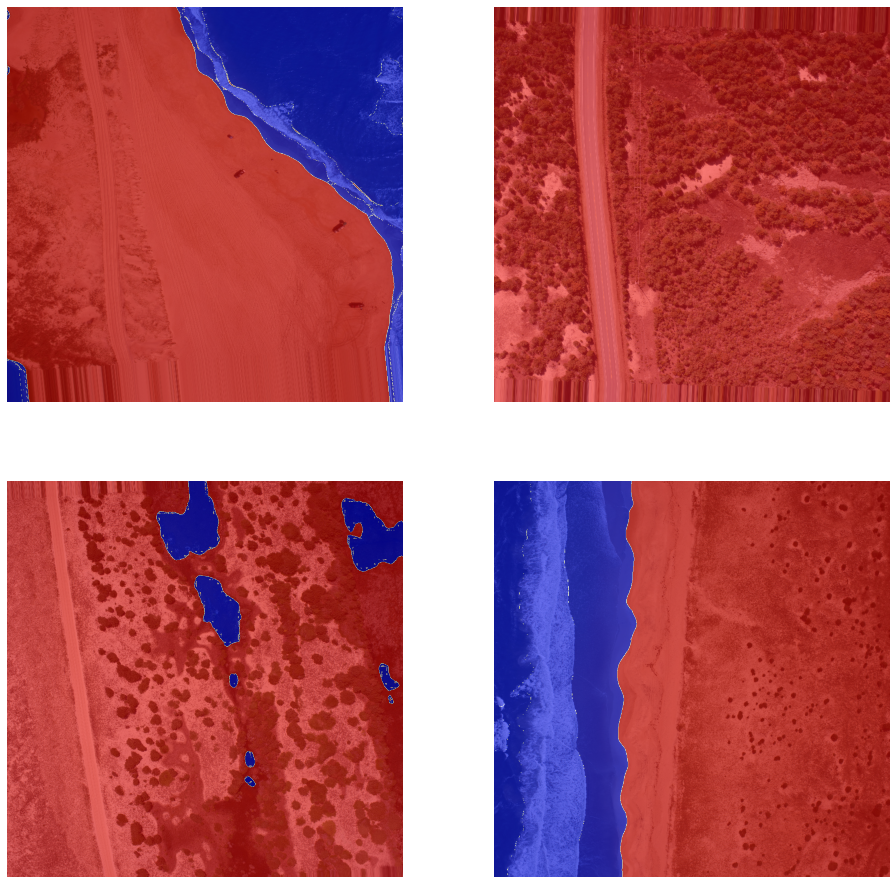

In [16]:
train_ds = get_training_dataset('binary')
val_ds = get_validation_dataset('binary')

for imgs,lbls in train_ds.take(1):
    print(imgs.shape)
    print(lbls.shape)

plt.figure(figsize=(16,16))
for imgs,lbls in train_ds.take(1):
  #print(lbls)
  for count,(im,lab) in enumerate(zip(imgs, lbls)):
     plt.subplot(int(BATCH_SIZE/2),int(BATCH_SIZE/2),count+1)
     plt.imshow(im)
     plt.imshow(lab.numpy().squeeze(), cmap=plt.cm.bwr, alpha=0.5, vmin=0, vmax=1)
     plt.axis('off')
# plt.show()
# plt.savefig(trainsamples_fig, dpi=200, bbox_inches='tight')
# plt.close('all')


Do the same with a batch of validation images. Do you notice any augmented images in either set?

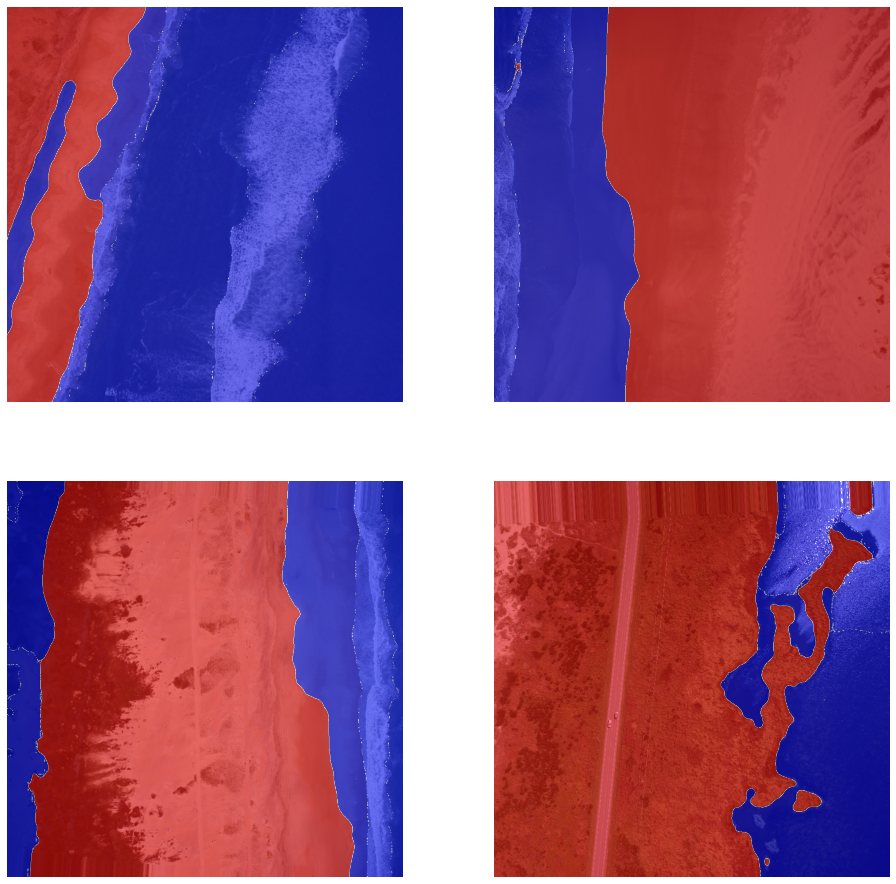

In [15]:
plt.figure(figsize=(16,16))
for imgs,lbls in val_ds.take(1):
  #print(lbls)
  for count,(im,lab) in enumerate(zip(imgs, lbls)):
     plt.subplot(int(BATCH_SIZE/2),int(BATCH_SIZE/2),count+1)
     plt.imshow(im)
     plt.imshow(lab.numpy().squeeze(), cmap=plt.cm.bwr, alpha=0.5, vmin=0, vmax=1)
     plt.axis('off')
# plt.show()
# plt.savefig(valsamples_fig, dpi=200, bbox_inches='tight')
# plt.close('all')

Next, we make and compile our model

model compilation is a necessary step, involving specifiying the 'optimizer' (we will use `adam` but `rmsprop` is also a good one to use, in my experience). The loss function is the Dice loss, and the metric we want to keep track of in the dice coefficient



##### Optimization strategy: Dealing with class imbalance


Segmentations of natural landscapes often involve so-called `class imbalance`. This is the situation where the average size of each class is not the same. In other words, different classes tend to occupy different amounts of pixels in imagery, on average. In the presence case, there are fewer pixels associated with smaller objects such as people and man-made objects

For binary segmentation, class imbalance can be especially bad because the `background` or `everything else` class tends to be large compared to the class of interest

This is problematic for training if it heavily biases the value of the loss function used to train the model toward the more dominant class

For these reasons, I recommend using Dice loss which tends to do better for class imbalanced problems. Scores for each class are calculated independently of their relative sizes and hence contribute fairly to the mean score.

The network tends to **ignore smaller classes**. A soft dice loss could be used to train a model. Unlike the IoU metric, the numerator is the number of correctly classified pixels, and the denominator is the total number of pixels in a class that is in both estimated and ground truth. Thus it is insensitive to the number of pixels total in each class.  

##### IoU metric

The intersection over union (IoU) or Jacard metric is a simple metric used to evaluate the performance of a segmentation algorithm. Given two masks $y_{true}, y_{pred}$ we evaluate 

$$IoU = \frac{y_{true} \cap y_{pred}}{y_{true} \cup y_{pred}}$$

The numerator is the number of common pixels, and the denominator is the total number of pixels in the two sets together

We'll keep track of that number too, which may be a more liberal score than the dice coefficient if class imbalance is an issue


In [17]:
nclasses = 1  #1 class in the sense of 1 class + background (one classifying node because binary decision)
model = res_unet((TARGET_SIZE, TARGET_SIZE, 3), BATCH_SIZE, 'binary', nclasses)

model.compile(optimizer = 'adam', loss = dice_coef_loss, metrics = [dice_coef, mean_iou])

An alternative way to train this model would be to use the `binary_crossentropy` loss function. Binary cross-entropy compares the log of probabilities of each predicted class with the log of the observed values. 

In [18]:
# model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = [dice_coef, mean_iou])

If you uncommented the cell below it would print a summary of the model layers and parametsr to the screen

In [19]:
# model.summary()

#### Checkpoint

Checkpoints are a way to save the current state of your model so that you can pick up from where you left off. They capture

* The architecture of the model, allowing you to re-create the model

* The weights of the model (for now, these will essentially be random numbers)

* The training configuration (loss, optimizer, epochs, and other meta-information - I'll explain what all this means later)


Then, it looks from images and corresponding label images, and trains a deep learning model **end-to-end**. This means that all the parameters in the models will be learned from our data, using a single large network that automatically learns how to map inputs (pixels and regions of images) to outputs (our classes). This is computationally intensive, hence the need for GPUs. Our workflow would therefore be described in the DL literature as 'end-to-end'. 

We are not using 'transfer learning', which is the (usually less computationally intensive) process of using not only existing models, but also re-purposing existing parameters sets learned from other data.


In [20]:
earlystop = EarlyStopping(monitor="val_loss",
                              mode="min", patience=patience)

# set checkpoint file
model_checkpoint = ModelCheckpoint(filepath, monitor='val_loss',
                                verbose=0, save_best_only=True, mode='min',
                                save_weights_only = True)


# models are sensitive to specification of learning rate. How do you decide? Answer: you don't. Use a learning rate scheduler

lr_callback = tf.keras.callbacks.LearningRateScheduler(lambda epoch: lrfn(epoch), verbose=True)

callbacks = [model_checkpoint, earlystop, lr_callback]

If `do_train` is `True` below, the model will train - warning! that would take a long time. Otherwise, load the weights that have been trained by this process previously

In [21]:
do_train = False #True

if do_train:
    history = model.fit(train_ds, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
                          validation_data=val_ds, validation_steps=validation_steps,
                          callbacks=callbacks)

    # Plot training history
    plot_seg_history(history, hist_fig)

    plt.close('all')
    K.clear_session()

else:
    model.load_weights(filepath)

This should be a familiar function by now, and is used in exactly the same way as in previous lessons

In [22]:
scores = model.evaluate(val_ds, steps=validation_steps)

print('loss={loss:0.4f}, Mean Dice={dice_coef:0.4f}'.format(loss=scores[0], dice_coef=scores[1]))

40/40 [==============================] - 6s 159ms/step - loss: 0.0915 - dice_coef: 0.9085 - mean_iou: 0.8406
loss=0.0915, Mean Dice=0.9085


Test on unseen sample imagery

In [23]:
sample_filenames = sorted(tf.io.gfile.glob(sample_data_path+os.sep+'*.jpg'))

sample_label_filenames = sorted(tf.io.gfile.glob(sample_label_data_path+os.sep+'*.jpg'))

In [24]:
sample_filenames[0]

'/home/jovyan/MLMONDAYS/3_ImageSeg/data/obx/sample/2018-10-06_14.34.32-DSC06420-N7251F.jpg'

In [25]:
sample_label_filenames[0]

'/home/jovyan/MLMONDAYS/3_ImageSeg/data/obx/sample_labels/2018-10-06_14.34.32-DSC06420-N7251F_deep_whitewater_shallow_no_water_label.jpg'

Below, each file in the list of sample jpeg files defined above are read in and used by the model to predict. The estimated label is shown as a semi-transparent overlay to the imagery

The ground truth label is shown as a black contour delineating deep water from everything else, where present

/srv/conda/envs/pangeo/lib/python3.6/site-packages/ipykernel_launcher.py:26: UserWarning: No contour levels were found within the data range.


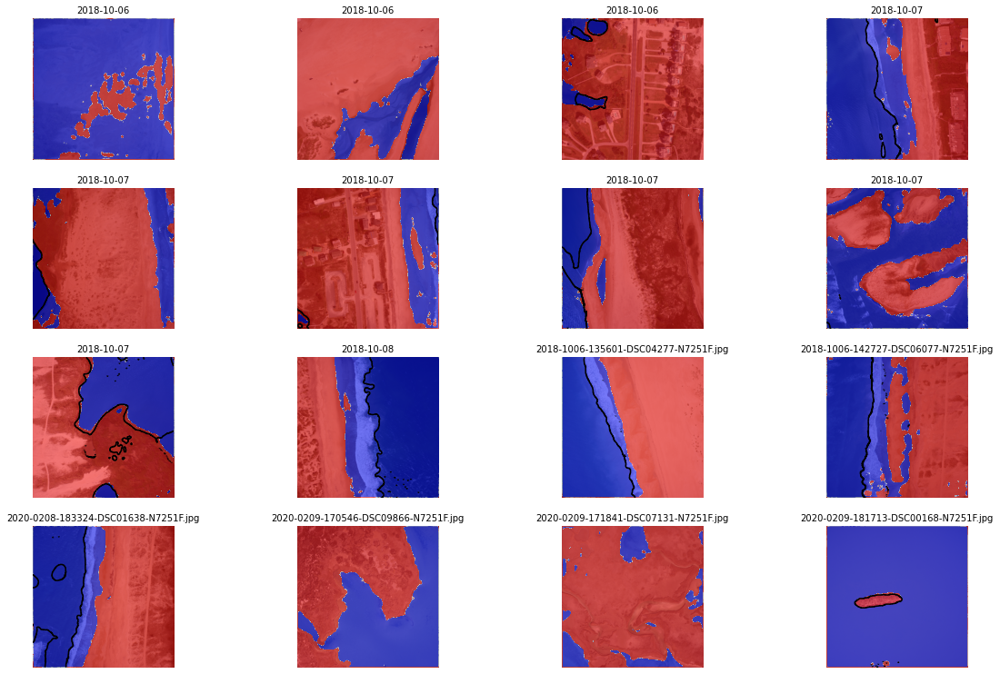

In [26]:
# make_sample_seg_plot(model, sample_filenames, test_samples_fig)

flag = 'binary'

plt.figure(figsize=(20,20))

for counter,f in enumerate(sample_filenames):
    image = seg_file2tensor(f)/255
    est_label = model.predict(tf.expand_dims(image, 0) , batch_size=1).squeeze()
    if flag is 'binary':
        est_label[est_label>0.5] = 1
        est_label = (est_label*255).astype(np.uint8)
    else:
        est_label = tf.argmax(est_label, axis=-1)

    plt.subplot(6,4,counter+1)
    name = sample_filenames[counter].split(os.sep)[-1].split('_')[0]
    plt.title(name, fontsize=10)
    plt.imshow(image)
    if flag is 'binary':
        plt.imshow(est_label, alpha=0.5, cmap=plt.cm.bwr, vmin=0, vmax=1)
    else:
        plt.imshow(est_label, alpha=0.5, cmap=plt.cm.bwr, vmin=0, vmax=3)

    label = seg_file2tensor(f.replace('.jpg', '_deep_whitewater_shallow_no_water_label.jpg').replace('sample', 'sample_labels'))
    plt.contour(label.numpy().squeeze(), [0,63,255], colors='k')
    plt.axis('off')

Above you can see examples of good predictions, other examples where water has been overpredicted. Water is less frequently underpredicted

Another way to view the ground truth label imagery would be to show them alone without the estimated label image

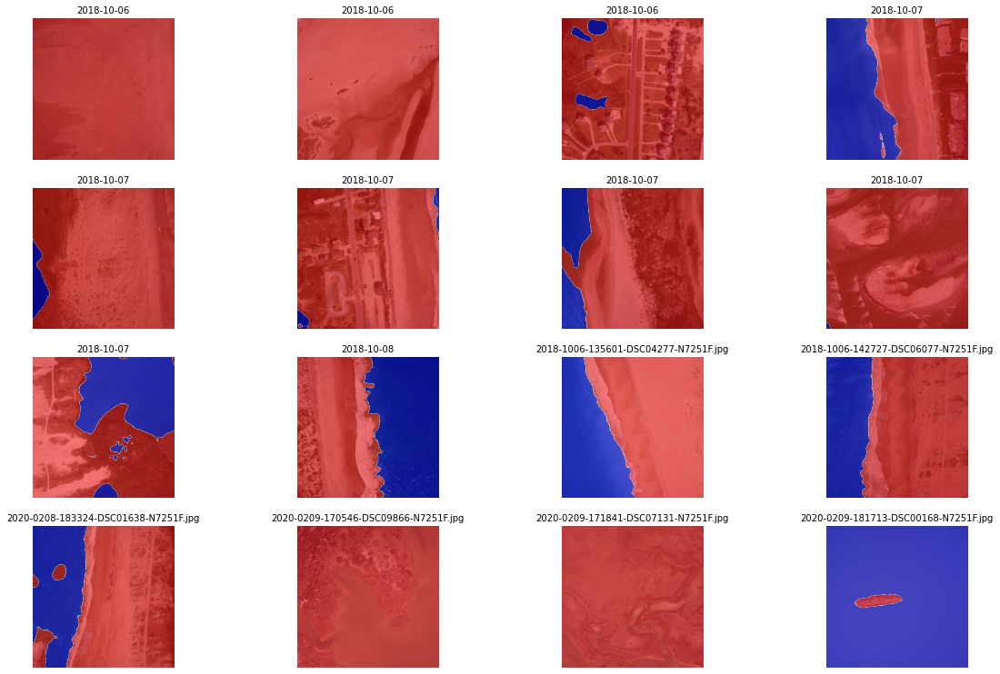

In [29]:
plt.figure(figsize=(20,20))

for counter,f in enumerate(sample_filenames):
    image = seg_file2tensor(f)/255

    plt.subplot(6,4,counter+1)
    name = sample_filenames[counter].split(os.sep)[-1].split('_')[0]
    plt.title(name, fontsize=10)
    plt.imshow(image)
    label = seg_file2tensor(f.replace('.jpg', '_deep_whitewater_shallow_no_water_label.jpg').replace('sample', 'sample_labels'))
    plt.imshow(label.numpy().squeeze()>63,  cmap=plt.cm.bwr, alpha=0.5, vmin=0, vmax=1)
    plt.axis('off')

## Multiclass segmentation

Next we'll use the same model framework to simultaneously estimate the likelihood of each class in each pixel. To do so, we use the 4-class version of the data processing pipeline

> Discussion point: how do `read_seg_tfrecord_obx_binary` and `read_seg_tfrecord_obx_multiclass` differ?

In [30]:
data_path= os.getcwd()+os.sep+"data/obx"

sample_data_path = os.getcwd()+os.sep+"data/obx/sample"
sample_label_data_path = os.getcwd()+os.sep+"data/obx/sample_labels"

trainsamples_fig = os.getcwd()+os.sep+'results/obx_sample_4class_trainsamples.png'
valsamples_fig = os.getcwd()+os.sep+'results/obx_sample_4class_valsamples.png'

augsamples_fig = os.getcwd()+os.sep+'results/obx_sample_4class_augtrainsamples.png'

filepath = os.getcwd()+os.sep+'results/obx_subset_4class_best_weights_model1.h5'

#### Dataset

We read the data in and prepare the model in the same way as before. The only differences are

1. Labels are now 3D stacks consisting of 2D binary masks for the presence or otherwise of that class. This is known as a 2D one-hot encoding

2. The model is told to expect the I x J x N label image, where N is the number of classes and I/J are the dimensions

3. The model uses a multiclass loss function

In [31]:
filenames = sorted(tf.io.gfile.glob(data_path+os.sep+'*.tfrec'))

nb_images = ims_per_shard * len(filenames)
print(nb_images)

split = int(len(filenames) * VALIDATION_SPLIT)

training_filenames = filenames[split:]
validation_filenames = filenames[:split]

validation_steps = int(nb_images // len(filenames) * len(validation_filenames)) // BATCH_SIZE
steps_per_epoch = int(nb_images // len(filenames) * len(training_filenames)) // BATCH_SIZE

340


In [32]:
train_ds = get_training_dataset('multiclass')
val_ds = get_validation_dataset('multiclass')

for imgs,lbls in train_ds.take(1):
    print(imgs.shape)
    print(lbls.shape)


(4, 768, 768, 3)
(4, 768, 768, 4)


Visualize some example label images

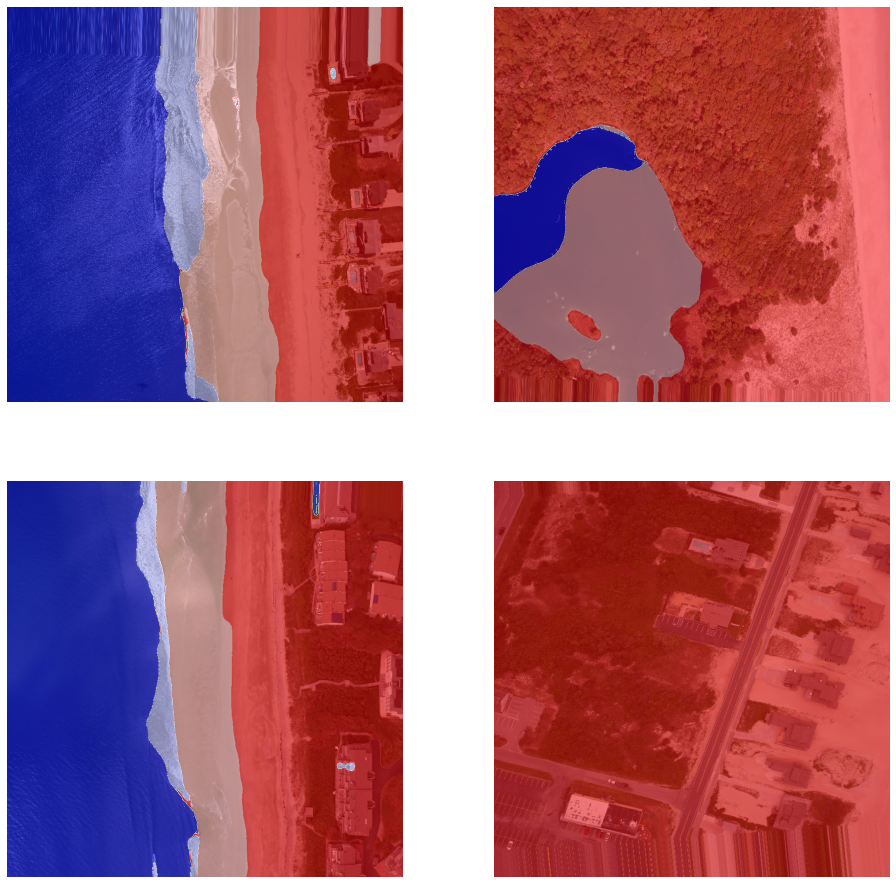

In [33]:
plt.figure(figsize=(16,16))
for imgs,lbls in train_ds.take(1):
  #print(lbls)
  for count,(im,lab) in enumerate(zip(imgs, lbls)):
     plt.subplot(int(BATCH_SIZE/2),int(BATCH_SIZE/2),count+1)
     plt.imshow(im)
     plt.imshow(np.argmax(lab,-1), cmap=plt.cm.bwr, alpha=0.5, vmin=0, vmax=3)
     plt.axis('off')
# plt.show()
# plt.savefig(trainsamples_fig.replace('.png', '_multiclass.png'), dpi=200, bbox_inches='tight')
# plt.close('all')

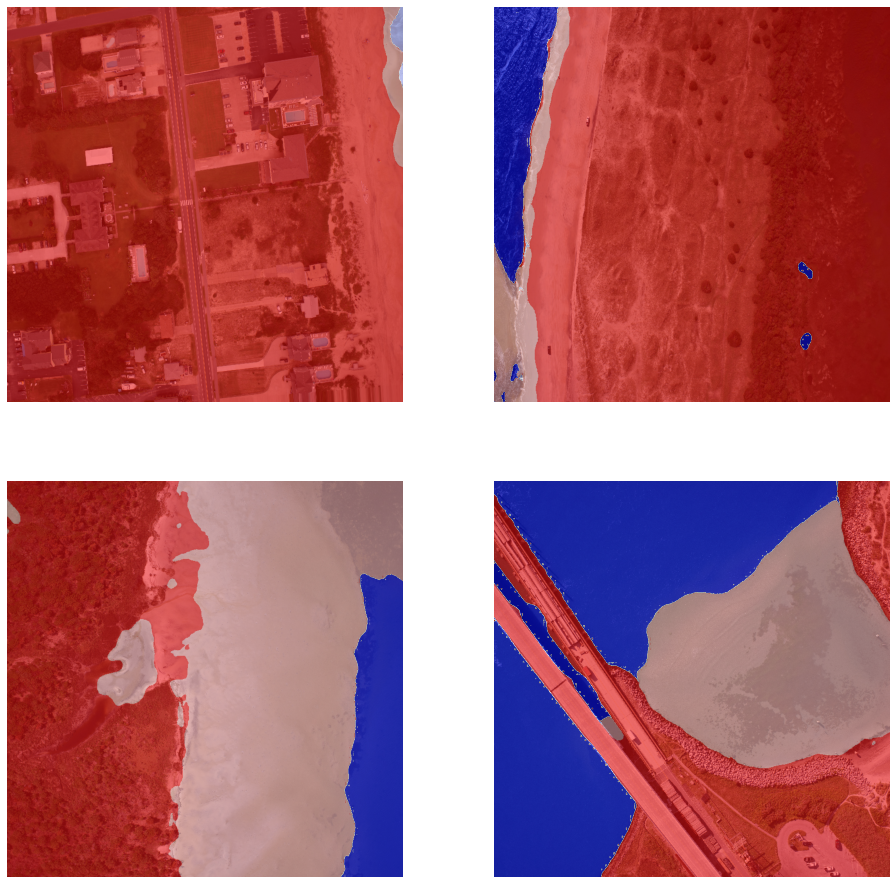

In [34]:
plt.figure(figsize=(16,16))
for imgs,lbls in val_ds.take(1):
  #print(lbls)
  for count,(im,lab) in enumerate(zip(imgs, lbls)):
     plt.subplot(int(BATCH_SIZE/2),int(BATCH_SIZE/2),count+1)
     plt.imshow(im)
     plt.imshow(np.argmax(lab,-1), cmap=plt.cm.bwr, alpha=0.5, vmin=0, vmax=3)
     plt.axis('off')
# plt.show()
# plt.savefig(valsamples_fig.replace('.png', '_multiclass.png'), dpi=200, bbox_inches='tight')
# plt.close('all')

#### Model definition

In [35]:
nclasses=4
model2 = res_unet((TARGET_SIZE, TARGET_SIZE, 3), BATCH_SIZE, 'multiclass', nclasses)
model2.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = [mean_iou])


earlystop = EarlyStopping(monitor="val_loss",
                              mode="min", patience=patience)

# set checkpoint file
model_checkpoint = ModelCheckpoint(filepath, monitor='val_loss',
                                verbose=0, save_best_only=True, mode='min',
                                save_weights_only = True)


# models are sensitive to specification of learning rate. How do you decide? Answer: you don't. Use a learning rate scheduler

lr_callback = tf.keras.callbacks.LearningRateScheduler(lambda epoch: lrfn(epoch), verbose=True)

callbacks = [model_checkpoint, earlystop, lr_callback]

#### Model training

In [36]:
do_train = False #True

if do_train:
    history = model2.fit(train_ds, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
                          validation_data=val_ds, validation_steps=validation_steps,
                          callbacks=callbacks)

    # Plot training history
    plot_seg_history_iou(history, hist_fig)

    plt.close('all')
    K.clear_session()

else:
    model2.load_weights(filepath)

#### Evaluate

In [37]:
scores = model2.evaluate(val_ds, steps=validation_steps)

print('loss={loss:0.4f}, Mean IoU={mean_iou:0.4f}'.format(loss=scores[0], mean_iou=scores[1]))

40/40 [==============================] - 7s 180ms/step - loss: 0.4486 - mean_iou: 0.6258
loss=0.4486, Mean IoU=0.6258


#### Predict on sample imagery

In [38]:
sample_filenames = sorted(tf.io.gfile.glob(sample_data_path+os.sep+'*.jpg'))
sample_label_filenames = sorted(tf.io.gfile.glob(sample_label_data_path+os.sep+'*.jpg'))

obs = [np.array(seg_file2tensor(f)/255, dtype=np.uint8).squeeze() for f in sample_label_filenames]

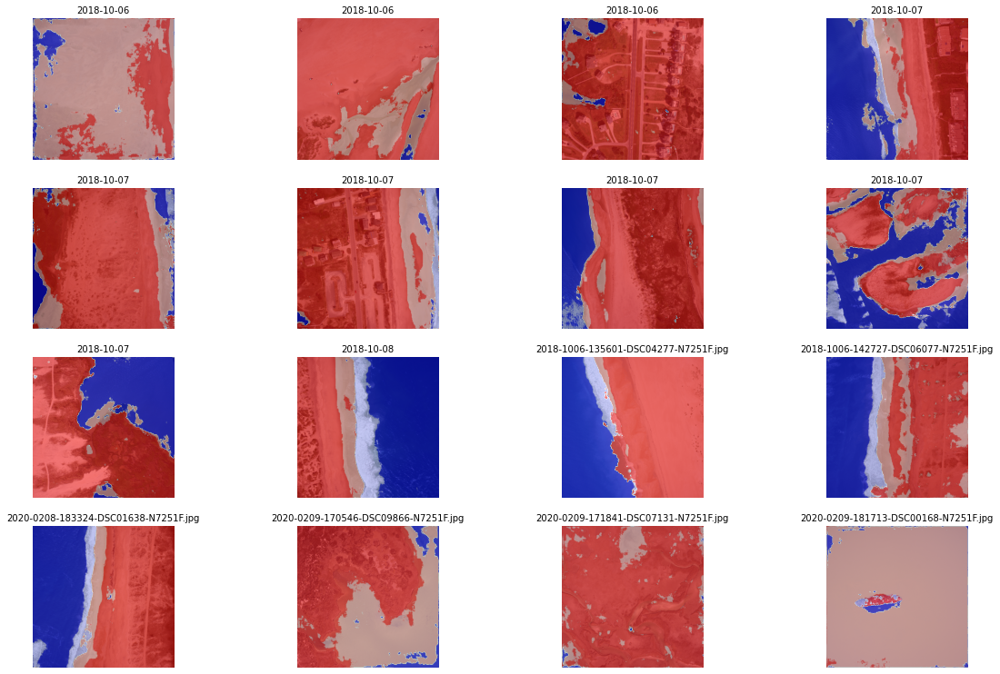

In [39]:
#imgs, lbls =make_sample_seg_plot(model2, sample_filenames, test_samples_fig, flag='multiclass')

plt.figure(figsize=(20,20))
imgs = []
lbls = []

for counter,f in enumerate(sample_filenames):
    image = seg_file2tensor(f)/255
    est_label = model2.predict(tf.expand_dims(image, 0) , batch_size=1).squeeze()

    est_label = tf.argmax(est_label, axis=-1)

    plt.subplot(6,4,counter+1)

    name = sample_filenames[counter].split(os.sep)[-1].split('_')[0]
    plt.title(name, fontsize=10)
    plt.imshow(image)

    plt.imshow(est_label, alpha=0.5, cmap=plt.cm.bwr, vmin=0, vmax=3)

    plt.axis('off')
    imgs.append((image.numpy()*255).astype(np.uint8))
    lbls.append(est_label)


The code below computes the mean IoU score for each ground truth -- estimate comparison

In [40]:
iou = []
for k in range(len(obs)):
    i = mean_iou_np(np.expand_dims(np.expand_dims(obs[k],axis=0),axis=-1), np.expand_dims(np.expand_dims(lbls[k],axis=0),axis=-1))
    iou.append(i)

print('Mean IoU={mean_iou:0.3f}'.format(mean_iou=np.mean(iou)))

Mean IoU=0.677


Scores greater than 0.5 are generally considered good. Remember that for spatial problems such as these, very small differences in relative position can amplify which tends to weight the IoU scores lower than an accuracy assessment on 1d data

## Multiclass segmentation with Conditional Random Field post-processing

Below we use the same task-specific image segmentation algorithm used by [Buscombe and Ritchie (2018)](https://www.mdpi.com/2076-3263/8/7/244), called a fully connected Conditional Random Field, or CRF.

Here we'll zero out ambiguous areas (areas classified as more than one thing) and use it to estimate what those labels are, based on a model it will construct that describes the relationship between the the labels present in the label image, and image features (colors and textures), and their relative spatial locations. It's a really powerful model for lots of types of segmentation post-processing tasks. Be guided by your imagination. 

> Discussion point: what does the `crf_refine` function do?

The image and label data are mapped onto nodes of a graph
nearby grid nodes with similar image intensity, texture and color are likely to be in the same class. The degree of similarity is controlled by the parameter `theta_col` (non-dimensional). As `theta_col` increases, larger image differences are tolerated within the same class. 

`compat_col` is a parameter that controls label "compatibility",  by  imposing  a  penalty  for  similar  grid  nodes  that  are  assigned different labels. Similarity in this context is again based on similar image intensity, texture and colors 

As `theta_spat` (non-dimensional) increases, larger spatial differences are tolerated within the same class, and `compat_col` imposes a penalty for nearby nodes that are assigned different labels

`num_iter` is the number of iterations the model will take . Increasing this number increases the total inference time

In your own time, play with these parameters and measure the response

In [41]:
imgs = []
lbls = []
model_num = []

### Predict on sample imagery

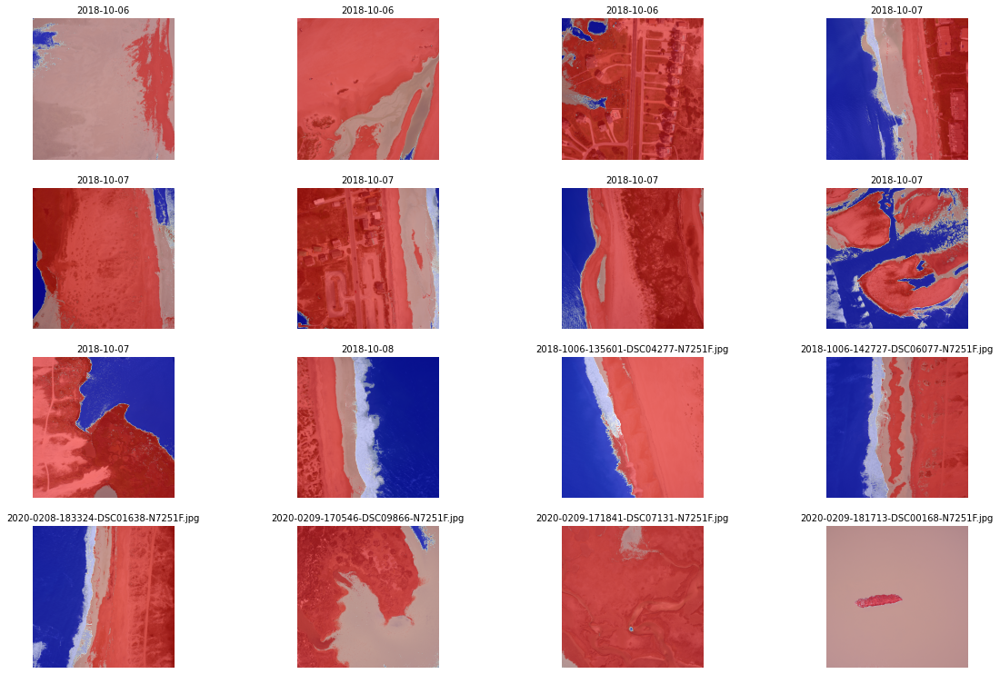

In [42]:
plt.figure(figsize=(20,20))

for counter,f in enumerate(sample_filenames):
  image = seg_file2tensor(f)/255
  est_label = model2.predict(tf.expand_dims(image, 0) , batch_size=1).squeeze()

  est_label = tf.argmax(est_label, axis=-1)

  label = est_label.numpy().astype('int')
  img = (image.numpy()*255).astype(np.uint8)
  est_labelA, kl1 = crf_refine(label, img )

  plt.subplot(6,4,counter+1)

  name = sample_filenames[counter].split(os.sep)[-1].split('_')[0]
  plt.title(name, fontsize=10)
  plt.imshow(image)

  plt.imshow(est_labelA, alpha=0.5, cmap=plt.cm.bwr, vmin=0, vmax=3)

  plt.axis('off')

  imgs.append(image)
  lbls.append(est_label)

### Compute IoU

In [43]:
obs = [np.array(seg_file2tensor(f), dtype=np.uint8).squeeze() for f in sample_label_filenames]

iou = []
for k in range(len(obs)):
    i = mean_iou_np(np.expand_dims(np.expand_dims(obs[k],axis=0),axis=-1), np.expand_dims(np.expand_dims(lbls[k],axis=0),axis=-1))
    iou.append(i)

print('Mean IoU={mean_iou:0.3f}'.format(mean_iou=np.mean(iou)))

Mean IoU=0.825


The CRF refinement makes a big improvement to the score

## Ensemble models with CRF refinement

What if we had two models for the same task, trained differently?

We already have a trained model using categorical crossentropy. This time we'll train with a different loss function, called a hinge loss

If the prediction (y) with the observation (y_t), compute 

> max(0, 1-|y - y_t|)

When y_t = y, e.g. y_t = y = 1, loss is max(0,1–1) = max(0,0) = 0 (perfect)

When y_t is very different than y, say y_t=1 and y=−1, loss is max(0,2) = 2 (very bad)


Dice loss and IoU are both region-based loss functions that aim to minimize the mismatch or maximize the overlap regions between ground truth and predicted segmentation.

The hinge loss is used for "maximum-margin" classification and belongs to a family of loss functions called Ranking Losses. You see hinge loss more commonly in classifiers like Support Vector Machines that maximize differences between classes in embedded space. We'll take a look at methods like that next week. For now, we're using Hinge loss in a segmentation problem, and it works in essentially the same way

In [44]:
nclasses=4
model3 = res_unet((TARGET_SIZE, TARGET_SIZE, 3), BATCH_SIZE, 'multiclass', nclasses)
model3.compile(optimizer = 'adam', loss = tf.keras.losses.CategoricalHinge(), metrics = [mean_iou])

earlystop = EarlyStopping(monitor="val_loss",
                              mode="min", patience=patience)

# set checkpoint file
model_checkpoint = ModelCheckpoint(filepath, monitor='val_loss',
                                verbose=0, save_best_only=True, mode='min',
                                save_weights_only = True)


# models are sensitive to specification of learning rate. How do you decide? Answer: you don't. Use a learning rate scheduler

lr_callback = tf.keras.callbacks.LearningRateScheduler(lambda epoch: lrfn(epoch), verbose=True)

callbacks = [model_checkpoint, earlystop, lr_callback]


do_train = False # True

if do_train:
    history = model3.fit(train_ds, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
                          validation_data=val_ds, validation_steps=validation_steps,
                          callbacks=callbacks)

    # # Plot training history
    # plot_seg_history_iou(history, hist_fig)

    # plt.close('all')
    K.clear_session()

else:
    model3.load_weights(filepath)


Evaluate

In [45]:
scores = model3.evaluate(val_ds, steps=validation_steps)

print('loss={loss:0.4f}, Mean IoU={mean_iou:0.4f}'.format(loss=scores[0], mean_iou=scores[1]))

40/40 [==============================] - 7s 183ms/step - loss: 0.4546 - mean_iou: 0.6751
loss=0.4546, Mean IoU=0.6751


Ok, the two models are comparable in mean accuracy but trained using different loss functions. How different are their respective predictions?

In [46]:
flag = 'multiclass'
f = sample_filenames[0]

Read the image and use both models to make predictions

In [47]:
image = seg_file2tensor(f)/255
est_label1 = model2.predict(tf.expand_dims(image, 0) , batch_size=1).squeeze()
if flag is 'binary':
    est_label1[est_label1>0.5] = 1
    est_label1 = (est_label1*255).astype(np.uint8)
else:
    est_label1 = tf.argmax(est_label1, axis=-1)


est_label2 = model3.predict(tf.expand_dims(image, 0) , batch_size=1).squeeze()
if flag is 'binary':
    est_label2[est_label2>0.5] = 1
    est_label2 = (est_label2*255).astype(np.uint8)
else:
    est_label2 = tf.argmax(est_label2, axis=-1)

Visualize

Text(0.5, 1.0, 'Model 2 estimate')

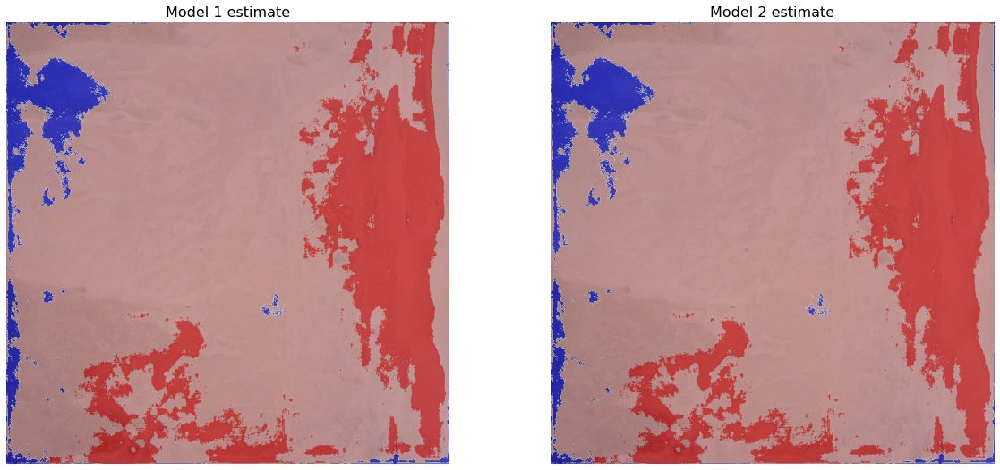

In [48]:
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(image)
plt.imshow(est_label1, alpha=0.5, cmap=plt.cm.bwr, vmin=0, vmax=3)
plt.axis('off')
plt.title('Model 1 estimate', fontsize=16)

plt.subplot(222)
plt.imshow(image)
plt.imshow(est_label2, alpha=0.5, cmap=plt.cm.bwr, vmin=0, vmax=3)
plt.axis('off')
plt.title('Model 2 estimate', fontsize=16)


Ok, there are some differences but not many. Let's take a look at a few more, with their respective CRF refinements

For each sample image, both models will make predicts and they will each will refined by a CRF task-specfiic prediction. The Kullback-Liebler scores of each CRF model inference will be compared; the lower score indicates the mask that is most closely fit by the model

That mask is returned as the ensemble model output

There are alternative ways to do this. Many! For example, you could take an average and round to the nearest integer. Pay attention to rounding errors! Or you could look for consensus among more than 2 models, or among different CRF realisations with different hyperparameters

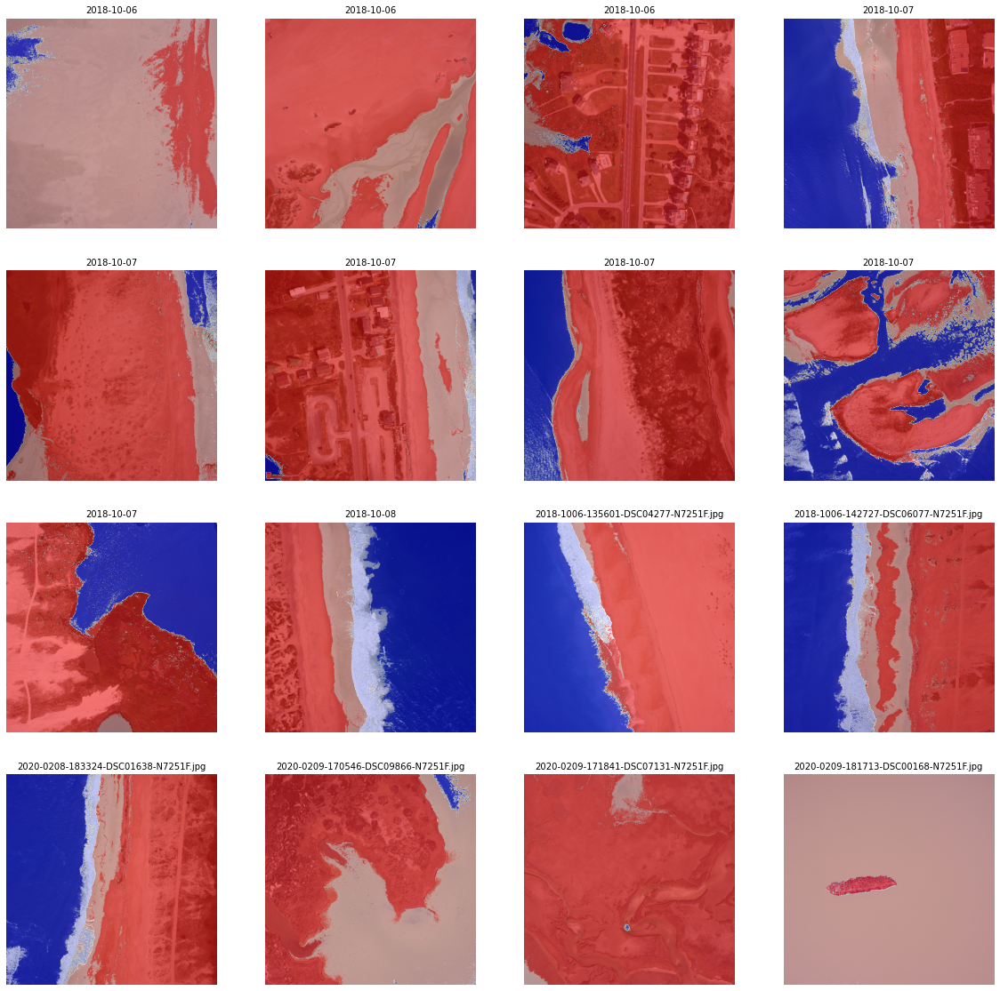

In [49]:
plt.figure(figsize=(20,20))
imgs = []
lbls = []
model_num = []

for counter,f in enumerate(sample_filenames):
    image = seg_file2tensor(f)/255
    est_label1 = model2.predict(tf.expand_dims(image, 0) , batch_size=1).squeeze()
    if flag is 'binary':
        est_label1[est_label1>0.5] = 1
        est_label1 = (est_label1*255).astype(np.uint8)
    else:
        est_label1 = tf.argmax(est_label1, axis=-1)


    est_label2 = model3.predict(tf.expand_dims(image, 0) , batch_size=1).squeeze()
    if flag is 'binary':
        est_label2[est_label2>0.5] = 1
        est_label2 = (est_label2*255).astype(np.uint8)
    else:
        est_label2 = tf.argmax(est_label2, axis=-1)

    label = est_label1.numpy().astype('int')
    img = (image.numpy()*255).astype(np.uint8)
    est_labelA, kl1 = crf_refine(label, img )
    label = est_label2.numpy().astype('int')
    est_labelB, kl2 = crf_refine(label, img )
    del label

    if kl1<kl2:
        est_label = est_labelA.copy()
        model_num.append(1)
    else:
        est_label = est_labelB.copy()
        model_num.append(2)

    if flag is 'binary':
        plt.subplot(6,4,counter+1)
    else:
        plt.subplot(4,4,counter+1)
    name = sample_filenames[counter].split(os.sep)[-1].split('_')[0]
    plt.title(name, fontsize=10)
    plt.imshow(image)
    if flag is 'binary':
        plt.imshow(est_label, alpha=0.5, cmap=plt.cm.gray, vmin=0, vmax=1)
    else:
        plt.imshow(est_label, alpha=0.5, cmap=plt.cm.bwr, vmin=0, vmax=3)

    plt.axis('off')

    imgs.append(image)
    lbls.append(est_label)

How's our IoU score?

In [50]:
iou = []
for k in range(len(obs)):
    i = mean_iou_np(np.expand_dims(np.expand_dims(obs[k],axis=0),axis=-1), np.expand_dims(np.expand_dims(lbls[k],axis=0),axis=-1))
    iou.append(i)

print('Mean IoU={mean_iou:0.3f}'.format(mean_iou=np.mean(iou)))

Mean IoU=0.826
